# ETL Pipeline Preparation
Follow the instructions below to help you create your ETL pipeline.

The first part of your data pipeline is the Extract, Transform, and Load process. In this step, the dataset will be read, cleaned and then store it in a SQLite database. The data must be cleaned with pandas. To load the data into an SQLite database, the method .to_sql(), which can be use with an SQLAlchemy engine.

### 1. Import libraries and load datasets.
- Import Python libraries
- Load `messages.csv` into a dataframe and inspect the first few lines.
- Load `categories.csv` into a dataframe and inspect the first few lines.

In [1]:
# import libraries
from pathlib import Path
from sqlalchemy import create_engine
import pandas as pd
import sys
import time

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio


In [2]:
# Get the current working directory
current_dir = Path.cwd()

# Get the parent directory
base_dir = current_dir.parent

# Define the data and source directories
data_dir = base_dir / 'data'
raw_data_path = base_dir / 'data' / 'raw'
processed_data_path = base_dir / 'data' / 'processed'

src_dir = base_dir / 'src'
notebooks_path = base_dir / 'notebooks'

images_dir = base_dir / 'images'
reports_dir = base_dir / 'reports'
models_dir = base_dir / 'models'

In [3]:
# load messages dataset
messages_path = raw_data_path / 'messages.csv'
messages = pd.read_csv(messages_path)
messages.head()

,id,message,original,genre
0,2,Weather update - a cold front from Cuba that c...,Un front froid se retrouve sur Cuba ce matin. ...,direct
1,7,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct
2,8,Looking for someone but no name,"Patnm, di Maryani relem pou li banm nouvel li ...",direct
3,9,UN reports Leogane 80-90 destroyed. Only Hospi...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct
4,12,"says: west side of Haiti, rest of the country ...",facade ouest d Haiti et le reste du pays aujou...,direct


In [4]:
# load categories dataset
categories_path = raw_data_path / 'categories.csv'
categories = pd.read_csv(categories_path)
categories.head()

,id,categories
0,2,related-1;request-0;offer-0;aid_related-0;medi...
1,7,related-1;request-0;offer-0;aid_related-1;medi...
2,8,related-1;request-0;offer-0;aid_related-0;medi...
3,9,related-1;request-1;offer-0;aid_related-1;medi...
4,12,related-1;request-0;offer-0;aid_related-0;medi...


### 2. Merge datasets.
- Merge the messages and categories datasets using the common id
- Assign this combined dataset to `df`, which will be cleaned in the following steps

To merge two dataframes in pandas, you can use the merge() function. The merge() function requires a common column in both dataframes on which to perform the merge.

In [5]:
# merge datasets
df = messages.merge(categories, on='id')
df.head()

,id,message,original,genre,categories
0,2,Weather update - a cold front from Cuba that c...,Un front froid se retrouve sur Cuba ce matin. ...,direct,related-1;request-0;offer-0;aid_related-0;medi...
1,7,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct,related-1;request-0;offer-0;aid_related-1;medi...
2,8,Looking for someone but no name,"Patnm, di Maryani relem pou li banm nouvel li ...",direct,related-1;request-0;offer-0;aid_related-0;medi...
3,9,UN reports Leogane 80-90 destroyed. Only Hospi...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,related-1;request-1;offer-0;aid_related-1;medi...
4,12,"says: west side of Haiti, rest of the country ...",facade ouest d Haiti et le reste du pays aujou...,direct,related-1;request-0;offer-0;aid_related-0;medi...


In [6]:
df.to_csv(raw_data_path / 'messages_categories.csv', index=False)

<p>
The data contains five columns:

- `id`: a unique identifier for each message
- `message`: the text content of the disaster-related message
- `original`: the original text of the message, likely in the language in which it was sent/received
- `genre`: the genre of the message (e.g., direct, news, social)
- `categories`: a semicolon-separated list of categories assigned to the message. Each category field is in the format `category-0` or `category-1`, indicating whether or not the message is categorized as belonging to that category.

Before performing any further analysis, we need to clean up the `categories` column by splitting it into separate columns. This will allow us to more easily analyze the category assignments for each message. Let's proceed with this data cleaning step.

We now have a clean dataframe where each category has its own column. Each category column contains either a 0 (indicating the message is not classified under that category) or a 1 (indicating the message is classified under that category).

Let's proceed with some exploratory data analysis. 

First, we can look at the distribution of messages across the different genres. 

Then, we'll look at the distribution of the number of categories assigned to each message. This will help us understand how many categories are typically assigned to a message.

Finally, we'll look at the distribution of messages across each category, which will help us understand how many messages are assigned to each category. This could be important for understanding the balance or imbalance of our dataset, which might influence how we approach modeling. 

Let's proceed with these exploratory data analyses.

The exploratory data analysis reveals several insights about the dataset:

1. **Distribution of Messages by Genre**: The majority of the messages belong to the 'direct' and 'news' genres. 'Social' genre messages are less common in this dataset.

2. **Distribution of Number of Categories per Message**: Most messages are assigned to 1 or 2 categories, although some are assigned to more. There are few messages assigned to a large number of categories.

3. **Distribution of Messages by Category**: The categories with the most messages are 'related', 'aid_related', 'weather_related', 'direct_report', and 'request'. Some categories, such as 'child_alone', 'offer', and 'tools', have very few messages. 

This analysis provides a good overview of the data and can guide further steps in the data processing and model building process. For example, the imbalance in the number of messages per category may need to be addressed during the model training process to avoid bias towards the majority classes.
</p>

### 3. Split `categories` into separate category columns.
- Split the values in the `categories` column on the `;` character so that each value becomes a separate column. You'll find [this method](https://pandas.pydata.org/pandas-docs/version/0.23/generated/pandas.Series.str.split.html) very helpful! Make sure to set `expand=True`.
- Use the first row of categories dataframe to create column names for the categories data.
- Rename columns of `categories` with new column names.

In [7]:
# create a dataframe of the 36 individual category columns
categories = df['categories'].str.split(';', expand=True)
categories.head()

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
1,related-1,request-0,offer-0,aid_related-1,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-1,floods-0,storm-1,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
2,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
3,related-1,request-1,offer-0,aid_related-1,medical_help-0,medical_products-1,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
4,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0


In [8]:
# select the first row of the categories dataframe
row = categories.iloc[0]

# use this row to extract a list of new column names for categories.
# one way is to apply a lambda function that takes everything 
# up to the second to last character of each string with slicing
category_colnames = row.apply(lambda x: x[:-2])
print(category_colnames)

0                    related
1                    request
2                      offer
3                aid_related
4               medical_help
5           medical_products
6          search_and_rescue
7                   security
8                   military
9                child_alone
10                     water
11                      food
12                   shelter
13                  clothing
14                     money
15            missing_people
16                  refugees
17                     death
18                 other_aid
19    infrastructure_related
20                 transport
21                 buildings
22               electricity
23                     tools
24                 hospitals
25                     shops
26               aid_centers
27      other_infrastructure
28           weather_related
29                    floods
30                     storm
31                      fire
32                earthquake
33                      cold
34            

In [9]:
# rename the columns of `categories`
categories.columns = category_colnames
categories.head()

,related,request,offer,aid_related,medical_help,medical_products,search_and_rescue,security,military,child_alone,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
1,related-1,request-0,offer-0,aid_related-1,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-1,floods-0,storm-1,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
2,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
3,related-1,request-1,offer-0,aid_related-1,medical_help-0,medical_products-1,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0
4,related-1,request-0,offer-0,aid_related-0,medical_help-0,medical_products-0,search_and_rescue-0,security-0,military-0,child_alone-0,...,aid_centers-0,other_infrastructure-0,weather_related-0,floods-0,storm-0,fire-0,earthquake-0,cold-0,other_weather-0,direct_report-0


### 4. Convert category values to just numbers 0 or 1.
- Iterate through the category columns in df to keep only the last character of each string (the 1 or 0). For example, `related-0` becomes `0`, `related-1` becomes `1`. Convert the string to a numeric value.
- You can perform [normal string actions on Pandas Series](https://pandas.pydata.org/pandas-docs/stable/text.html#indexing-with-str), like indexing, by including `.str` after the Series. You may need to first convert the Series to be of type string, which you can do with `astype(str)`.

In [10]:
# Method 1: Loop over columns
start_time = time.time()

for column in categories:
    # set each value to be the last character of the string
    categories[column] = categories[column].str[-1]
    
    # convert column from string to numeric
    categories[column] = categories[column].astype(int)

print(f"Method 1 execution time: {time.time() - start_time} seconds") 
categories.head()

Method 1 execution time: 0.18979454040527344 seconds


,related,request,offer,aid_related,medical_help,medical_products,search_and_rescue,security,military,child_alone,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


We now have a clean dataframe where each category has its own column. Each category column contains either a 0 (indicating the message is not classified under that category) or a 1 (indicating the message is classified under that category).

Let's proceed with some exploratory data analysis.

First, we can look at the distribution of messages across the different genres.

Then, we'll look at the distribution of the number of categories assigned to each message. This will help us understand how many categories are typically assigned to a message.

Finally, we'll look at the distribution of messages across each category, which will help us understand how many messages are assigned to each category. This could be important for understanding the balance or imbalance of our dataset, which might influence how we approach modeling.

Let's proceed with these exploratory data analyses.

In the final document, must use a function with python decorator to measure time.

In [11]:
# Method 2: Vectorized operations
start_time = time.time()

# Ensure all values are strings
categories = categories.astype(str)

categories = categories.applymap(lambda x: int(x[-1]))

print(f"Method 2 execution time: {time.time() - start_time} seconds")

Method 2 execution time: 0.31029272079467773 seconds


It might seem counter-intuitive because we often hear that vectorized operations are faster than loops in Python. However, there are a few reasons why looping over the columns may be faster than `applymap` in this case:

1. **Overhead of function calls:** Each cell's operation in `applymap` involves a function call (the lambda function). If the DataFrame is large, this overhead can add up.

2. **Efficiency of underlying operations:** The `.str` accessor and the `astype` function in pandas are highly optimized and can often be faster than applying a function to each element of a DataFrame. 

3. **Data Type Conversion:** In the vectorized version, you're converting the entire DataFrame to strings at once, which can be slower than converting one column at a time.

In general, the relative performance of vectorized operations versus loops can depend on many factors, including the size and type of the data, the complexity of the operation, and the specific implementation of the functions being used. It's always a good idea to benchmark different approaches on your specific data and use case, as you've done here.

Finally, while performance is important, it's also valuable to consider code readability and simplicity. The loop version might be a bit easier to understand for someone reading your code, as it more explicitly shows the operations being performed on each column.

### 5. Replace `categories` column in `df` with new category columns.
- Drop the categories column from the df dataframe since it is no longer needed.
- Concatenate df and categories data frames.

In [12]:
# drop the original categories column from `df`
df = df.drop('categories', axis=1)

df.head()

,id,message,original,genre
0,2,Weather update - a cold front from Cuba that c...,Un front froid se retrouve sur Cuba ce matin. ...,direct
1,7,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct
2,8,Looking for someone but no name,"Patnm, di Maryani relem pou li banm nouvel li ...",direct
3,9,UN reports Leogane 80-90 destroyed. Only Hospi...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct
4,12,"says: west side of Haiti, rest of the country ...",facade ouest d Haiti et le reste du pays aujou...,direct


In [13]:
# concatenate the original dataframe with the new `categories` dataframe
df = pd.concat([df, categories], axis=1)
df.head()

,id,message,original,genre,related,request,offer,aid_related,medical_help,medical_products,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,2,Weather update - a cold front from Cuba that c...,Un front froid se retrouve sur Cuba ce matin. ...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct,1,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
2,8,Looking for someone but no name,"Patnm, di Maryani relem pou li banm nouvel li ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9,UN reports Leogane 80-90 destroyed. Only Hospi...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,12,"says: west side of Haiti, rest of the country ...",facade ouest d Haiti et le reste du pays aujou...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In this code, df.drop('categories', axis=1) drops the 'categories' column from the dataframe. The axis=1 argument specifies that we want to drop a column (not a row).

pd.concat([df, categories], axis=1) concatenates the df and categories dataframes. The axis=1 argument specifies that we want to concatenate the dataframes side by side (i.e., add the categories columns to the right of the df columns). If axis=0, the function would append categories under df.

The print(df.head()) line then prints the first few rows of the new dataframe, so you can check that the operations were successful.

In [14]:
df.columns

Index(['id', 'message', 'original', 'genre', 'related', 'request', 'offer',
       'aid_related', 'medical_help', 'medical_products', 'search_and_rescue',
       'security', 'military', 'child_alone', 'water', 'food', 'shelter',
       'clothing', 'money', 'missing_people', 'refugees', 'death', 'other_aid',
       'infrastructure_related', 'transport', 'buildings', 'electricity',
       'tools', 'hospitals', 'shops', 'aid_centers', 'other_infrastructure',
       'weather_related', 'floods', 'storm', 'fire', 'earthquake', 'cold',
       'other_weather', 'direct_report'],
      dtype='object')

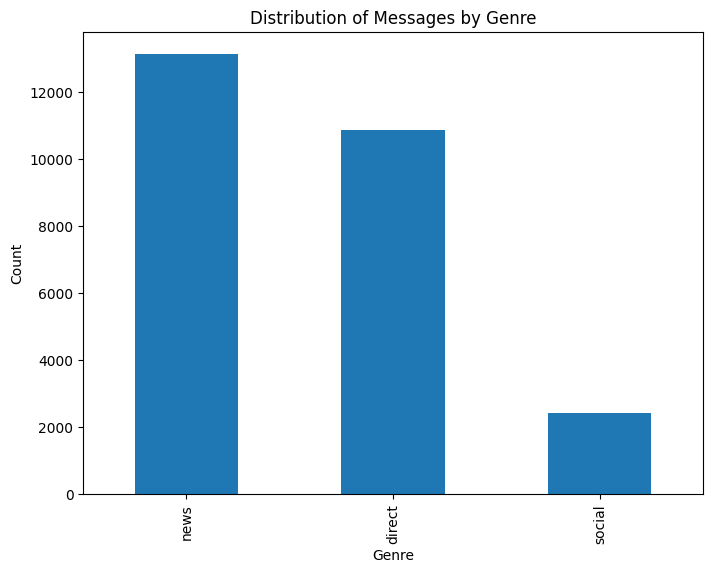

In [15]:
# Check the distribution of messages across the different genres
genre_counts = df['genre'].value_counts()
genre_counts.plot(kind='bar', figsize=(8,6))
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Distribution of Messages by Genre')
plt.show()

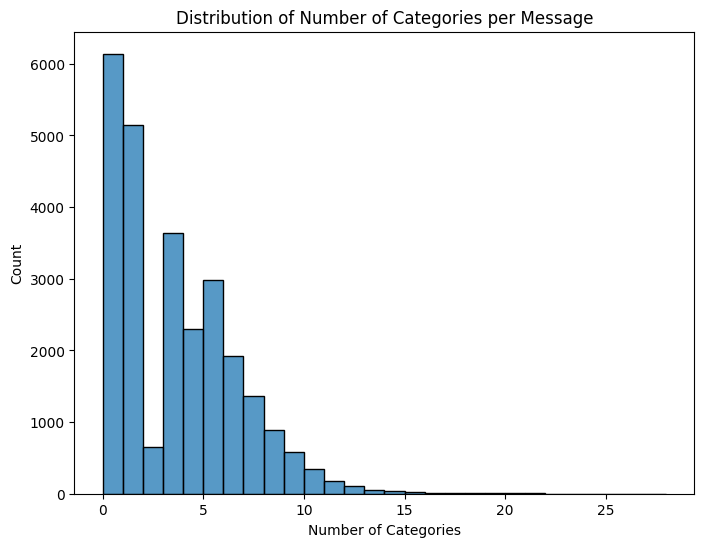

In [16]:
# Check the distribution of the number of categories assigned to each message
category_counts = df.iloc[:, 4:].sum(axis=1)
plt.figure(figsize=(8,6))
sns.histplot(category_counts, bins=range(0, category_counts.max()+2))
plt.xlabel('Number of Categories')
plt.ylabel('Count')
plt.title('Distribution of Number of Categories per Message')
plt.show()

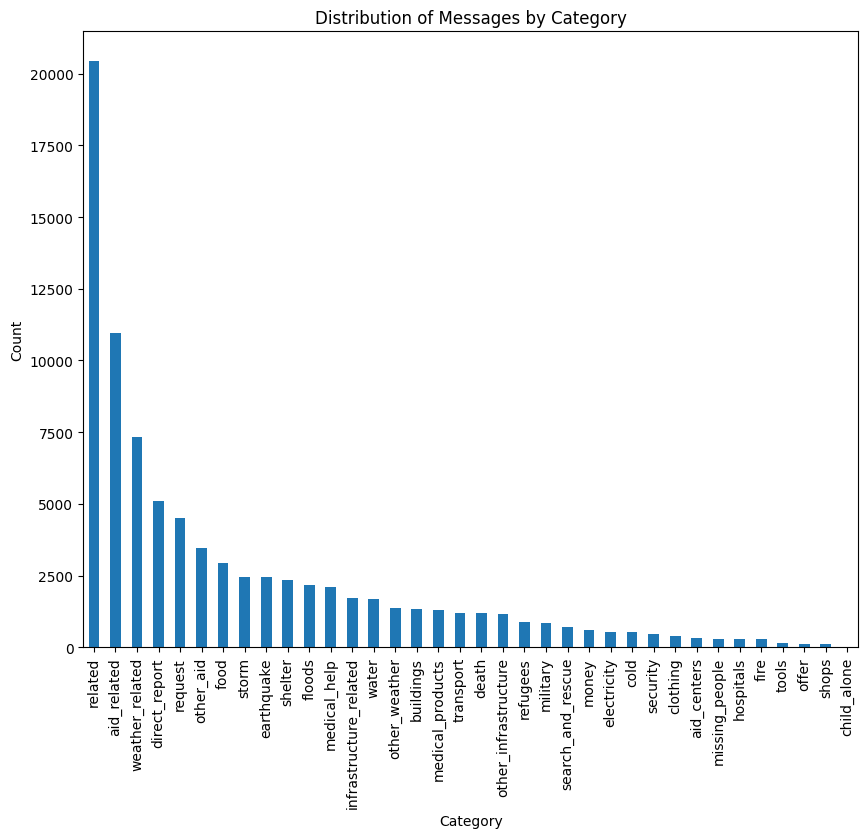

In [17]:

# Check the distribution of messages across each category
category_names = df.columns[4:]
category_message_counts = df[category_names].sum().sort_values(ascending=False)
category_message_counts.plot(kind='bar', figsize=(10,8))
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Distribution of Messages by Category')
plt.xticks(rotation=90)
plt.show()

The exploratory data analysis reveals several insights about the dataset:

Distribution of Messages by Genre: The majority of the messages belong to the 'direct' and 'news' genres. 'Social' genre messages are less common in this dataset.

Distribution of Number of Categories per Message: Most messages are assigned to 1 or 2 categories, although some are assigned to more. There are few messages assigned to a large number of categories.

Distribution of Messages by Category: The categories with the most messages are 'related', 'aid_related', 'weather_related', 'direct_report', and 'request'. Some categories, such as 'child_alone', 'offer', and 'tools', have very few messages.

This analysis provides a good overview of the data and can guide further steps in the data processing and model building process. For example, the imbalance in the number of messages per category may need to be addressed during the model training process to avoid bias towards the majority classes.

### 6. Remove duplicates.
- Check how many duplicates are in this dataset.
- Drop the duplicates.
- Confirm duplicates were removed.

In [18]:
# check number of duplicates
# Check how many duplicates are in this dataset
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 170


In [19]:
# Drop the duplicates
df = df.drop_duplicates()

In [20]:
# check number of duplicates
# Confirm duplicates were removed
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows after removal: {num_duplicates}")

Number of duplicate rows after removal: 0


In [21]:
# Distribution of Messages by Genre
genre_counts = df['genre'].value_counts().reset_index()
genre_counts.columns = ['Genre', 'Count']
fig = px.bar(genre_counts, x='Genre', y='Count', title='Distribution of Messages by Genre', 
             labels={'Genre':'Genre', 'Count':'Count'}, color='Genre',
             color_discrete_sequence=px.colors.qualitative.Plotly)
fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [ ]:
# Save the figure
image_path = images_dir / "category_message_distribution.png"
pio.write_image(fig, image_path)

In [ ]:
# Distribution of Number of Categories per Message
category_counts = df.iloc[:, 4:].sum(axis=1).value_counts().reset_index().sort_values('index')
category_counts.columns = ['Number of Categories', 'Count']
fig = px.bar(category_counts, x='Number of Categories', y='Count', title='Distribution of Number of Categories per Message', 
             labels={'Number of Categories':'Number of Categories', 'Count':'Count'},
             color='Number of Categories', color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

In [ ]:
# Distribution of Messages by Category
category_message_counts = df[category_names].sum().sort_values(ascending=False).reset_index()
category_message_counts.columns = ['Category', 'Count']
fig = px.bar(category_message_counts, x='Category', y='Count', title='Distribution of Messages by Category', 
             labels={'Category':'Category', 'Count':'Count'}, color='Category',
             color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

In [ ]:
# Save the figure
image_path = images_dir / "message_distribution.png"
pio.write_image(fig, image_path)

### 7. Save the clean dataset into an sqlite database.
You can do this with pandas [`to_sql` method](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.to_sql.html) combined with the SQLAlchemy library. Remember to import SQLAlchemy's `create_engine` in the first cell of this notebook to use it below.

In [21]:
df.to_csv()

',id,message,original,genre,related,request,offer,aid_related,medical_help,medical_products,search_and_rescue,security,military,child_alone,water,food,shelter,clothing,money,missing_people,refugees,death,other_aid,infrastructure_related,transport,buildings,electricity,tools,hospitals,shops,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report\n0,2,Weather update - a cold front from Cuba that could pass over Haiti,Un front froid se retrouve sur Cuba ce matin. Il pourrait traverser Haiti demain. Des averses de pluie isolee sont encore prevues sur notre region ce soi,direct,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0\n1,7,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0\n2,8,Looking for someone but no name,"Patnm, di Maryani relem pou li banm nouvel li ak timoun yo. Mesi se john jean depi Monben kwochi

In [22]:
# Define the database path
database_filepath = processed_data_path / 'DisasterResponse.db'

# Create an engine that connects to an SQLite database file
engine = create_engine(f'sqlite:///{database_filepath}')

# Write the DataFrame to a table in the SQLite database
df.to_sql('DisasterResponseTable', engine, index=False, if_exists='replace')

26216

In this code, create_engine('sqlite:///DisasterResponse.db') creates an engine that connects to an SQLite database file named "DisasterResponse.db". If this file doesn't already exist, it will be created.

df.to_sql('DisasterResponseTable', engine, index=False, if_exists='replace') then writes the DataFrame to a table named "DisasterResponseTable" in the database. The index=False argument is used to prevent pandas from writing the DataFrame's index to the database. The if_exists='replace' argument means that if the table already exists, it will be replaced with the new data.

### 8. Use this notebook to complete `etl_pipeline.py`
Use the template file attached in the Resources folder to write a script that runs the steps above to create a database based on new datasets specified by the user. Alternatively, you can complete `etl_pipeline.py` in the classroom on the `Project Workspace IDE` coming later.